Extracting Dataset using kaggle API

In [ ]:
# installing the kaggle library
!pip install kaggle

In [ ]:
# configuring the path of kaggle.json file
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

importing the Dog vs Cat dataset from Kaggle

In [ ]:
# kaggle api

!kaggle competitions download -c dogs-vs-cats

 99% 801M/812M [00:15<00:00, 53.5MB/s]
100% 812M/812M [00:15<00:00, 56.1MB/s]


In [ ]:
!ls

dogs-vs-cats.zip  kaggle.json  sample_data


In [ ]:
# Extracting the compressed dataset
from zipfile import ZipFile

dataset='/content/dogs-vs-cats.zip'

with ZipFile(dataset,'r') as zip:
  zip.extractall()
  print("The dataset is extracted")

The dataset is extracted


In [ ]:
# Extracting the compressed dataset
from zipfile import ZipFile

dataset='/content/train.zip'

with ZipFile(dataset,'r') as zip:
  zip.extractall()
  print("The dataset is extracted")

The dataset is extracted


In [ ]:
import os
# counting the number of files in train folder
path,dirs,files=next(os.walk('/content/train'))
file_count=len(files)
print('Number of images:',file_count)

Number of images: 25000


printing the name of images

In [ ]:
file_names=os.listdir('/content/train')
print(file_names)

['dog.1904.jpg', 'dog.7028.jpg', 'cat.9112.jpg', 'dog.6059.jpg', 'dog.8146.jpg', 'cat.1673.jpg', 'cat.10517.jpg', 'cat.3210.jpg', 'dog.6950.jpg', 'dog.10543.jpg', 'cat.10380.jpg', 'dog.5150.jpg', 'cat.11294.jpg', 'dog.11476.jpg', 'dog.6244.jpg', 'cat.7006.jpg', 'cat.10772.jpg', 'dog.5441.jpg', 'dog.587.jpg', 'dog.8345.jpg', 'dog.10712.jpg', 'dog.1574.jpg', 'dog.7593.jpg', 'dog.4689.jpg', 'dog.3042.jpg', 'cat.11768.jpg', 'cat.6820.jpg', 'cat.1860.jpg', 'dog.2416.jpg', 'dog.4892.jpg', 'dog.11664.jpg', 'dog.7275.jpg', 'dog.3653.jpg', 'dog.9335.jpg', 'dog.9711.jpg', 'dog.423.jpg', 'cat.4713.jpg', 'dog.10376.jpg', 'cat.10064.jpg', 'dog.11219.jpg', 'cat.6138.jpg', 'cat.9068.jpg', 'cat.6466.jpg', 'dog.924.jpg', 'cat.10056.jpg', 'dog.4470.jpg', 'cat.3309.jpg', 'cat.6111.jpg', 'dog.3462.jpg', 'cat.3637.jpg', 'cat.6582.jpg', 'dog.6696.jpg', 'dog.932.jpg', 'dog.10480.jpg', 'cat.4934.jpg', 'dog.5205.jpg', 'dog.4545.jpg', 'dog.11175.jpg', 'cat.2962.jpg', 'cat.10760.jpg', 'dog.9492.jpg', 'dog.9831.j

Importing the Dependiences

In [ ]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from sklearn.model_selection import train_test_split
from google.colab.patches import cv2_imshow

Displaying the images of Dogs and Cats

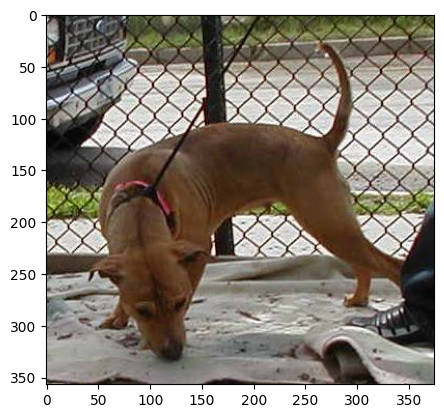

In [ ]:
# display dog img

img=mpimg.imread('/content/train/dog.9354.jpg')
plt.imshow(img)


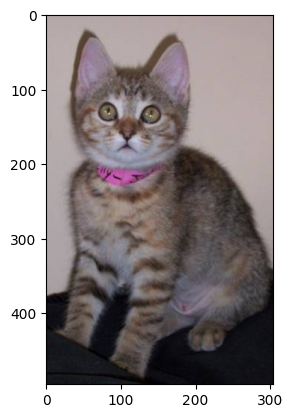

In [ ]:
# display cat img

img=mpimg.imread('/content/train/cat.7632.jpg')
plt.imshow(img)


In [ ]:
file_names=os.listdir('/content/train')
dog_count=0
cat_count=0

for img_file in file_names:
  name=img_file[0:3]
  if name=='dog':
    dog_count+=1
  else:
    cat_count+=1
print("Number of dog images = ",dog_count)
print("Number of cat images = ",cat_count)

Number of dog images =  12500
Number of cat images =  12500


Resizing all the images

In [ ]:
# creating a directory for resized images
os.mkdir('/content/image resized')

In [ ]:
original_folder='/content/train/'
resized_folder='/content/image resized/'

for i in range(2000):
  filename=os.listdir(original_folder)[i]
  img_path=original_folder+filename
  img=Image.open(img_path)
  img=img.resize((224,224))
  img=img.convert('RGB')

  newImgPath=resized_folder+filename
  img.save(newImgPath)


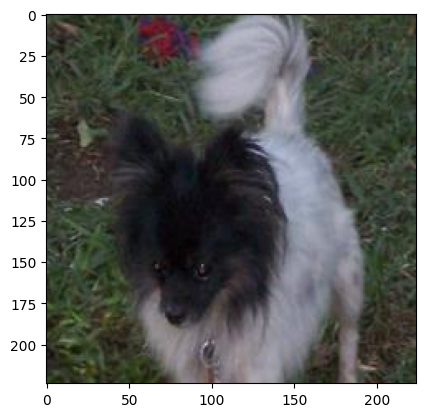

In [ ]:
# display resized dog img

img=mpimg.imread('/content/image resized/dog.10012.jpg')
imgplt=plt.imshow(img)
plt.show()

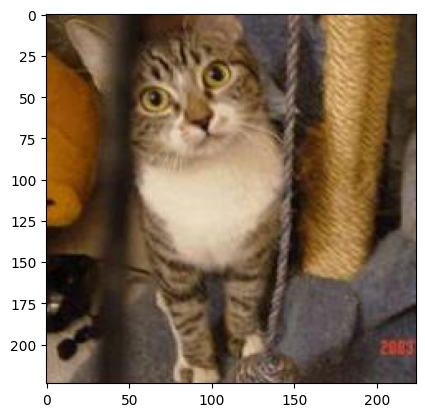

In [ ]:
# display resized cat img

img=mpimg.imread('/content/image resized/cat.936.jpg')
imgplt=plt.imshow(img)
plt.show()

Cat ->0

Dog ->1

Creating the Labels for resized images of dogs and cats

In [ ]:
# creating a for loop to assign Labels

filenames=os.listdir('/content/image resized/')
labels=[]
for i in range(2000):
  file_name=filenames[i]
  label=file_name[0:3]

  if label=='dog':
    labels.append(1)
  else:
    labels.append(0)

In [ ]:
print(filenames[0:5])
print(len(filenames))

['dog.1904.jpg', 'dog.7028.jpg', 'cat.9112.jpg', 'dog.6059.jpg', 'dog.8146.jpg']
2000


In [ ]:
print(labels[0:5])
print(len(labels))

[1, 1, 0, 1, 1]
2000


In [ ]:
# counting the images of dogs and cats out of 2000 images

values,counts=np.unique(labels,return_counts=True)
print(values)
print(counts)

[0 1]
[ 992 1008]


Converting all the resize images to numpy arrays

In [ ]:
import cv2
import glob

In [ ]:
image_directory='/content/image resized/'
image_extension=['png','jpg']
files=[]
[files.extend(glob.glob(image_directory+'*.'+ e)) for e in image_extension]

dog_cat_images=np.asarray([cv2.imread(file) for file in files])

In [ ]:
print(dog_cat_images)

[[[[234 222 188]
   [255 253 225]
   [230 226 207]
   ...
   [128 117 113]
   [192 168 162]
   [250 221 214]]

  [[239 227 193]
   [249 241 212]
   [225 221 202]
   ...
   [194 185 182]
   [156 136 131]
   [241 215 209]]

  [[255 246 214]
   [242 236 207]
   [199 198 178]
   ...
   [201 199 198]
   [162 150 146]
   [230 211 206]]

  ...

  [[ 26  50  26]
   [ 36  60  36]
   [ 38  61  39]
   ...
   [ 47  58  42]
   [ 49  59  43]
   [ 65  75  59]]

  [[ 39  65  42]
   [ 39  65  42]
   [ 33  56  34]
   ...
   [ 57  67  51]
   [ 50  60  44]
   [ 58  68  52]]

  [[ 29  55  32]
   [ 31  57  34]
   [ 43  66  44]
   ...
   [ 65  75  59]
   [ 45  55  39]
   [ 38  48  32]]]


 [[[228 207 229]
   [214 193 215]
   [201 181 200]
   ...
   [ 99  97 116]
   [ 95  94 114]
   [121 120 140]]

  [[170 149 171]
   [185 165 184]
   [146 126 145]
   ...
   [111 109 129]
   [102 101 121]
   [120 119 139]]

  [[162 142 161]
   [212 192 211]
   [147 127 146]
   ...
   [118 115 137]
   [104 102 124]
   [113 111

In [ ]:
type(dog_cat_images)

numpy.ndarray

In [ ]:
print(dog_cat_images.shape)

(2000, 224, 224, 3)


In [ ]:
x=dog_cat_images
y=np.asarray(labels)

Train test split

In [ ]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=2)

In [ ]:
print(x.shape,x_train.shape,x_test.shape)

(2000, 224, 224, 3) (1600, 224, 224, 3) (400, 224, 224, 3)


In [ ]:
#scalling the data
x_train_scaled=x_train/255
x_test_scaled=x_test/255

In [ ]:
print(x_train_scaled)
print(x_test_scaled)

[[[[0.18823529 0.23529412 0.24313725]
   [0.17254902 0.21960784 0.22745098]
   [0.15686275 0.2        0.21568627]
   ...
   [0.72156863 0.74901961 0.69019608]
   [0.7372549  0.76470588 0.70588235]
   [0.7254902  0.75294118 0.69411765]]

  [[0.17254902 0.21960784 0.22745098]
   [0.15686275 0.20392157 0.21176471]
   [0.14901961 0.19215686 0.20784314]
   ...
   [0.71764706 0.74509804 0.68627451]
   [0.72941176 0.75686275 0.69803922]
   [0.72156863 0.74901961 0.69019608]]

  [[0.14509804 0.19215686 0.2       ]
   [0.14117647 0.18823529 0.19607843]
   [0.14509804 0.18823529 0.20392157]
   ...
   [0.70588235 0.73333333 0.6745098 ]
   [0.72156863 0.74901961 0.69019608]
   [0.71764706 0.74509804 0.68627451]]

  ...

  [[0.65098039 0.63529412 0.54117647]
   [0.6627451  0.64705882 0.55294118]
   [0.66666667 0.64313725 0.55294118]
   ...
   [0.68627451 0.60392157 0.47843137]
   [0.70196078 0.61960784 0.49411765]
   [0.70980392 0.62745098 0.50196078]]

  [[0.64705882 0.63921569 0.54509804]
   [0.6

Building the Neural Network

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub


In [ ]:
mobilenet_model='https://tfhub.dev/google/tf2-preview/mobilenet_v2/classification/4'
pretrained_model=hub.KerasLayer(mobilenet_model,input_shape=(224,224),trainable=False)


In [ ]:
from tensorflow import keras
num_of_classes = 2
input_shape = (224, 224, 3)
mobilenet_model = keras.Sequential([
    hub.KerasLayer(
        'https://tfhub.dev/google/tf2-preview/mobilenet_v2/classification/4',
        input_shape=input_shape,
        trainable=False
    )
])
mobilenet_model.add(keras.layers.Dense(num_of_classes))


ValueError: Only instances of `keras.Layer` can be added to a Sequential model. Received: <tensorflow_hub.keras_layer.KerasLayer object at 0x7e901c564ac0> (of type <class 'tensorflow_hub.keras_layer.KerasLayer'>)

In [ ]:
mobilenet_model.compile(loss='sparse_categorical_crossentropy',
                        optimizer='adam', metrics=['accuracy'])


In [ ]:
mobilenet_model.fit(x_train_scaled,y_train,epochs=5)
#score,acc=mobilenet_model.evaluate(x_test_scaled,y_test)

Predicted System

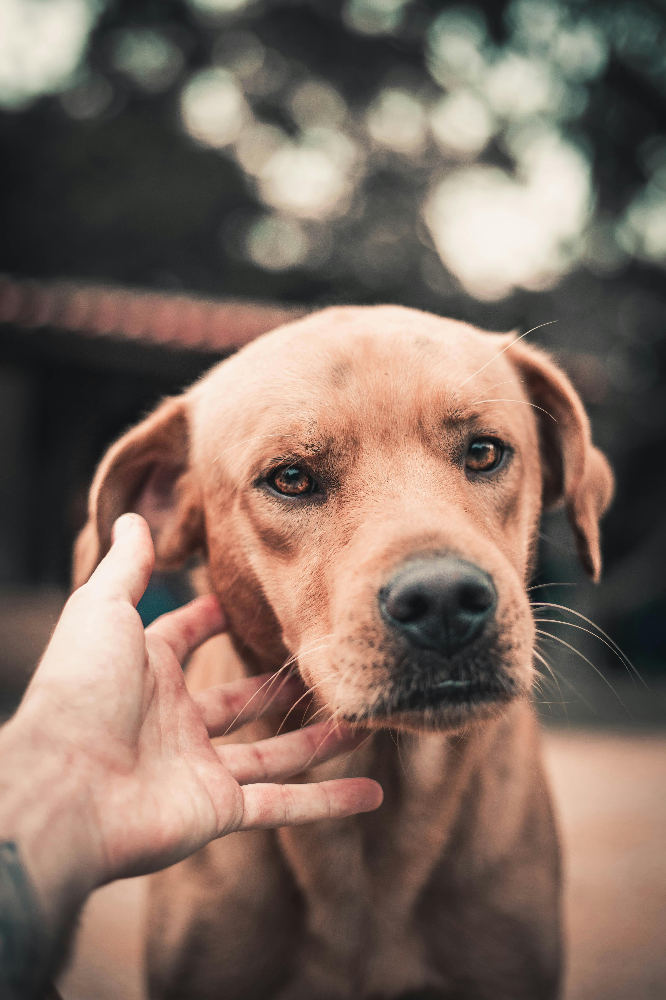

ValueError: cannot reshape array of size 150528 into shape (1,224,244,3)

In [ ]:
input_image_path=input("path of image to be predicted")

input_image=cv2.imread(input_image_path)
cv2_imshow(input_image)

input_image_resize=cv2.resize(input_image,(224,224))
input_image_scaled=input_image_resize/225
image_reshaped=np.reshape(input_image_scaled,[1,224,244,3])
input_prediction=mobilenet_model.predict(image_reshaped)
input_pred_label=np.argmax(input_prediction)
if input_pred_label==0:
  print("The image represents a cat")
else:
  print("The image represents a dog")
